# Fast Manila : A Geospatial Analysis of where to run fast and furious around the streets of Metro Manila During Curfew Hours

## Executive Summary

Metro Manila has always been flooded by vehicles plying its roads on a daily basis to the point of a non-existent rush hour scenario on major thoroughfares. This results in roads, national highways or not, to be congested inside of Metro Manila for hours on end. The pandemic has brought about adjustments to the commuting behavior in Metro Manila, allowing specific points in time where roads have minimal to no traffic present. In order to take advantage of the traffic ease, the researchers have used Geospatial Analysis to understand Metro Manila's road map and generate corresponding maps where motorists can freely drive without worrying much about traffic.

## Introduction

While the streets of Metro Manila is flooded with vehicles left and right, the current pandemic has greatly reduced the amount of traffic plying the roads every day. However, traffic is still there especially during the day thanks to commuters and people who still go to the office for their professional obligations. Before the pandemic, traffic congestion in Metro Manila was considered as the "world's worst" (Lopez, 2019) according to a survey conducted by Waze back in 2015. 

On the other hand, when the lockdown was imposed last March 2020, "roads cleared, no unending lines of vehicles, cleaner air and no sound pollution echoing through virtually every corner of the metropolis" (Rappler, 2020). Although clearer roads were enjoyed by private vehicles, the seemingly traffic-free state of Metro Manila appears to be short-lived. As the government started easing up on quarantine restrictions, traffic started piling up again, making Metro Manila's lack of transport capacity evident once more. The only times where motorists can enjoy traffic-free driving is when they travel during curfew hours. According to an article written by CNN Philippines (2021), the mayors of Metro Manila has agreed upon new curfew hours starting May 1, 2021 from 10pm to 4am. This indicates that motorists who have essential duties during this time period are guaranteed to experience minimal to no traffic at all. In line with this, the researchers want to utilize Geospatial Analysis to further understand the streets of Metro Manila and generate insights on how to further improve the driving experience of motorists during curfew hours when traveling around the area.

## Methodology

In exploring the data for this report, the Open Street Maps available in jojie was used for the reference dataset where users can extract information depending on the string query sent to the database. The general workflow for the formation of this report is shown below.

1. Data Extraction
2. Data Creation
3. Exploratory Data Analysis
4. Map generation
5. Analysis of results

## Data Extraction

In order to get the data for the Geospatial Analysis of Metro Manila's streets, the researchers extracted the required information using SQL to access the database.

In [1]:
import ast
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, HTML

import folium
from folium import Marker, GeoJson, Choropleth, Circle, Marker
from folium.plugins import HeatMap, MarkerCluster
import psycopg2
import geopandas as gpd
from geopandas.tools import geocode
import shapely.wkt
from shapely.geometry import LineString, Point
import osmnx as ox
ox.config(log_file=True, log_console=True, use_cache=True)

from sklearn.base import clone
from sklearn.cluster import KMeans
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import calinski_harabasz_score

import warnings
warnings.filterwarnings('ignore')

In [2]:
conn = psycopg2.connect(dbname="postgis", 
                 user="gsa2021", 
                 password="5HOA&yn6$B", 
                 host="192.168.212.99", 
                 port=32771)

In [3]:
# Check the available schema in our database:
pd.read_sql('''
SELECT * FROM information_schema.schemata 
''',conn)

,catalog_name,schema_name,schema_owner,default_character_set_catalog,default_character_set_schema,default_character_set_name,sql_path
0,postgis,pg_catalog,postgres,None,None,None,None
1,postgis,information_schema,postgres,None,None,None,None
2,postgis,public,postgres,None,None,None,None
3,postgis,gadm,postgres,None,None,None,None


In [4]:
df = pd.read_sql('''
SELECT amenity, 
    COUNT(*) as counts
FROM ph_point as p
WHERE p.amenity != 'None'
GROUP BY amenity
ORDER BY counts DESC
''',conn)
df

,amenity,counts
0,restaurant,8869
1,school,5853
2,bank,5369
3,fast_food,5249
4,place_of_worship,4652
...,...,...
300,weighbridge,1
301,well,1
302,wellness,1
303,wheeler,1


In [5]:
set(df.amenity)

{'BPI ATM',
 'Barangay Hall',
 'Barangay Yakal Hall',
 'Barangay_Police_Outpost',
 'Barber Shop',
 'Barbershop',
 'Basketball Court',
 'Casimero',
 'CheckPoint',
 'Contractor',
 'Farmacia Southern',
 'Highway',
 'Home Parking2',
 'House',
 'Kapampangan cuisine',
 'Karaoke Bar',
 'McKinley Hill, Taguig',
 'Motorcycle Rental',
 'Pira Hospital',
 'Public_Transpotation',
 'Residence',
 'SIDC',
 'Sagada Town Hall',
 'Salvacion Ferry Terminal',
 'State College',
 'Subdivision',
 'Transport',
 'Uload Phils',
 'Vulcanizing',
 'Wedding Cakes',
 'adult_gaming_centre',
 'air_filling',
 'airline_office',
 'airsoft_gamesite',
 'animal_boarding',
 'animal_breeding',
 'appliance',
 'arcade',
 'arts_centre',
 'assembly_hall',
 'atm',
 'atm;fountain',
 'baby_hatch',
 'bank',
 'bank;restaurant',
 'bar',
 'bar;restaurant',
 'barangay_outpost',
 'basketball court',
 'basketball_court',
 'bbq',
 'bench',
 'bicycle_parking',
 'bicycle_rental',
 'bicycle_repair_station',
 'biergarten',
 'birthing_centre',
 '

In [6]:
ph_shp = gpd.read_postgis('''
SELECT *
FROM gadm.ph
''', conn, geom_col = 'geom')
ph_shp

,gid,gid_0,name_0,gid_1,name_1,nl_name_1,gid_2,name_2,varname_2,nl_name_2,type_2,engtype_2,cc_2,hasc_2,geom
0,1,PHL,Philippines,PHL.1_1,Abra,None,PHL.1.1_1,Bangued,None,None,Bayan|Munisipyo,Municipality,140101,PH.AB.BN,"MULTIPOLYGON (((120.62710 17.49300, 120.62177 ..."
1,2,PHL,Philippines,PHL.1_1,Abra,None,PHL.1.2_1,Boliney,None,None,Bayan|Munisipyo,Municipality,140102,PH.AB.BL,"MULTIPOLYGON (((120.99042 17.39802, 120.98631 ..."
2,3,PHL,Philippines,PHL.1_1,Abra,None,PHL.1.3_1,Bucay,None,None,Bayan|Munisipyo,Municipality,140103,PH.AB.BU,"MULTIPOLYGON (((120.70788 17.45395, 120.70621 ..."
3,4,PHL,Philippines,PHL.1_1,Abra,None,PHL.1.4_1,Bucloc,None,None,Bayan|Munisipyo,Municipality,140104,PH.AB.BC,"MULTIPOLYGON (((120.78956 17.41699, 120.78922 ..."
4,5,PHL,Philippines,PHL.1_1,Abra,None,PHL.1.5_1,Daguioman,None,None,Bayan|Munisipyo,Municipality,140105,PH.AB.DG,"MULTIPOLYGON (((120.92917 17.41307, 120.92464 ..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1642,1640,PHL,Philippines,PHL.81_1,Zamboanga Sibugay,None,PHL.81.9_1,Naga,None,None,Bayan|Munisipyo,Municipality,98309,PH.ZS.NG,"MULTIPOLYGON (((122.77500 7.76833, 122.77528 7..."
1643,1645,PHL,Philippines,PHL.81_1,Zamboanga Sibugay,None,PHL.81.14_1,Talusan,None,None,Bayan|Munisipyo,Municipality,98314,PH.ZS.TL,"MULTIPOLYGON (((122.91917 7.34111, 122.91861 7..."
1644,1641,PHL,Philippines,PHL.81_1,Zamboanga Sibugay,None,PHL.81.10_1,Olutanga,None,None,Bayan|Munisipyo,Municipality,98310,PH.ZS.OU,"MULTIPOLYGON (((122.85805 7.27653, 122.85837 7..."
1645,1642,PHL,Philippines,PHL.81_1,Zamboanga Sibugay,None,PHL.81.11_1,Payao,None,None,Bayan|Munisipyo,Municipality,98311,PH.ZS.PY,"MULTIPOLYGON (((122.69195 7.46229, 122.69139 7..."


In [7]:
mm_pts = gpd.read_postgis('''
SELECT *
FROM ph_point p
JOIN gadm.ph g ON st_within(p.way,g.geom)
WHERE p.amenity != 'None' AND g.name_1 = 'Metropolitan Manila'
''', conn, geom_col = 'way')
mm_pts

,osm_id,access,addr:housename,addr:housenumber,addr:interpolation,admin_level,aerialway,aeroway,amenity,area,...,nl_name_1,gid_2,name_2,varname_2,nl_name_2,type_2,engtype_2,cc_2,hasc_2,geom
0,1323171902,None,None,None,None,None,None,None,place_of_worship,None,...,None,PHL.47.13_1,Pateros,None,None,Lungsod|Siyudad,City,137606,PH.MM.PT,0106000020E610000001000000010300000001000000A3...
1,5055079422,None,None,None,None,None,None,None,nightclub,None,...,None,PHL.47.13_1,Pateros,None,None,Lungsod|Siyudad,City,137606,PH.MM.PT,0106000020E610000001000000010300000001000000A3...
2,255058348,None,None,None,None,None,None,None,school,None,...,None,PHL.47.13_1,Pateros,None,None,Lungsod|Siyudad,City,137606,PH.MM.PT,0106000020E610000001000000010300000001000000A3...
3,1323171838,None,None,None,None,None,None,None,place_of_worship,None,...,None,PHL.47.13_1,Pateros,None,None,Lungsod|Siyudad,City,137606,PH.MM.PT,0106000020E610000001000000010300000001000000A3...
4,255071432,None,None,None,None,None,None,None,school,None,...,None,PHL.47.13_1,Pateros,None,None,Lungsod|Siyudad,City,137606,PH.MM.PT,0106000020E610000001000000010300000001000000A3...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14909,4102699590,None,None,None,None,None,None,None,place_of_worship,None,...,None,PHL.47.17_1,Valenzuela,"Valenzuela, City of",None,Lungsod|Siyudad,City,137504,PH.MM.VL,0106000020E610000001000000010300000002000000DD...
14910,4771230923,None,None,Lot 20,None,None,None,None,car_rental,None,...,None,PHL.47.17_1,Valenzuela,"Valenzuela, City of",None,Lungsod|Siyudad,City,137504,PH.MM.VL,0106000020E610000001000000010300000002000000DD...
14911,5601567148,None,None,None,None,None,None,None,place_of_worship,None,...,None,PHL.47.17_1,Valenzuela,"Valenzuela, City of",None,Lungsod|Siyudad,City,137504,PH.MM.VL,0106000020E610000001000000010300000002000000DD...
14912,4607797789,None,None,None,None,None,None,None,shelter,None,...,None,PHL.47.17_1,Valenzuela,"Valenzuela, City of",None,Lungsod|Siyudad,City,137504,PH.MM.VL,0106000020E610000001000000010300000002000000DD...


In [8]:
mm_shp = ph_shp[ph_shp['name_1']=='Metropolitan Manila']
mm_shp

,gid,gid_0,name_0,gid_1,name_1,nl_name_1,gid_2,name_2,varname_2,nl_name_2,type_2,engtype_2,cc_2,hasc_2,geom
959,973,PHL,Philippines,PHL.47_1,Metropolitan Manila,None,PHL.47.13_1,Pateros,None,None,Lungsod|Siyudad,City,137606,PH.MM.PT,"MULTIPOLYGON (((121.06864 14.53992, 121.06883 ..."
960,974,PHL,Philippines,PHL.47_1,Metropolitan Manila,None,PHL.47.14_1,Quezon City,None,None,Lungsod|Siyudad,City,137404,PH.MM.QE,"MULTIPOLYGON (((121.01576 14.60610, 121.01511 ..."
973,965,PHL,Philippines,PHL.47_1,Metropolitan Manila,None,PHL.47.5_1,Mandaluyong,"Mandaluyong, City of",None,Lungsod|Siyudad,City,137401,PH.MM.MD,"MULTIPOLYGON (((121.05405 14.57747, 121.05408 ..."
974,966,PHL,Philippines,PHL.47_1,Metropolitan Manila,None,PHL.47.6_1,Manila,"City of Manila|Manila, City of",None,Lungsod|Siyudad,City,133900,PH.MM.MN,"MULTIPOLYGON (((120.99142 14.56218, 120.98849 ..."
975,967,PHL,Philippines,PHL.47_1,Metropolitan Manila,None,PHL.47.7_1,Marikina,"Marikina, City of",None,Lungsod|Siyudad,City,137402,PH.MM.MR,"MULTIPOLYGON (((121.07346 14.61962, 121.07432 ..."
976,968,PHL,Philippines,PHL.47_1,Metropolitan Manila,None,PHL.47.8_1,Muntinlupa,"Muntinlupa, City of",None,Lungsod|Siyudad,City,137603,PH.MM.MU,"MULTIPOLYGON (((121.02339 14.35760, 121.02313 ..."
981,961,PHL,Philippines,PHL.47_1,Metropolitan Manila,None,PHL.47.1_1,Kalookan City,None,None,Lungsod|Siyudad,City,137501,PH.MM.KL,"MULTIPOLYGON (((121.02068 14.71426, 121.02071 ..."
982,962,PHL,Philippines,PHL.47_1,Metropolitan Manila,None,PHL.47.2_1,Las Piñas,"Las Piñas, City of",None,Lungsod|Siyudad,City,137601,PH.MM.LP,"MULTIPOLYGON (((120.97972 14.49306, 120.98000 ..."
983,963,PHL,Philippines,PHL.47_1,Metropolitan Manila,None,PHL.47.3_1,Makati City,"Makati, City of",None,Lungsod|Siyudad,City,137602,PH.MM.MK,"MULTIPOLYGON (((121.06578 14.53872, 121.06594 ..."
984,964,PHL,Philippines,PHL.47_1,Metropolitan Manila,None,PHL.47.4_1,Malabon,None,None,Lungsod|Siyudad,City,137502,PH.MM.ML,"MULTIPOLYGON (((120.95800 14.65938, 120.95796 ..."


# Data Creation

Before using the data for analysis, the researchers have performed several data processing techniques. After consolidating the data from the database, the researchers have filtered streets that have nearby police stations, as well as medical facilities to ensure that driver safety comes first.

In [9]:
popo = ['Barangay_Police_Outpost','police','police outpost','police_outpost']
df_popo = mm_pts[mm_pts.amenity.apply(lambda x: x in popo)][['amenity', 'name', 'way']]
df_popo

,amenity,name,way
40,police,Makati Police Precint 8,POINT (121.06546 14.54908)
50,police,Police Community Precinct,POINT (121.07615 14.54699)
55,police,Pcp-2,POINT (121.07623 14.55102)
75,police,Cebu detachment,POINT (121.00843 14.60963)
95,police,Police Community Precinct 1,POINT (121.00190 14.61740)
...,...,...,...
14557,police,Taguig Central Police Station,POINT (121.07069 14.52864)
14615,police,Pcp- 3,POINT (120.98506 14.67752)
14688,police,Malinta Police Community Precinct,POINT (120.96447 14.69219)
14726,police,Barangay Outpost,POINT (120.97333 14.68948)


In [10]:
med_ = ['Pira Hospital', 'district hospital', 'hospital', 'clinic', 'first_aid', 'fire_station']
df_med = mm_pts[mm_pts.amenity.apply(lambda x: x in med_)][['amenity', 'name', 'way']]
df_med

,amenity,name,way
13,clinic,Avila Polyclinic,POINT (121.06487 14.54415)
14,hospital,Allied Care Experts (ACE) Medical Center,POINT (121.06522 14.54408)
37,clinic,None,POINT (121.06687 14.54613)
39,fire_station,Makati Fire Station 10,POINT (121.06525 14.54904)
60,fire_station,Pateros Fire Station,POINT (121.07353 14.55164)
...,...,...,...
14772,hospital,Valenzuela Emergency Hospital,POINT (120.95770 14.70920)
14846,clinic,98 msa agri,POINT (120.99519 14.69854)
14886,clinic,Pascual Gentle Hands Maternity Clinic,POINT (121.02002 14.70329)
14888,hospital,Bagbaguin Family Hospital,POINT (121.00517 14.71878)


## Exploratory Data Analysis

Upon filtering out only the police stations and medical facilities, the figure below shows that Quezon City and Parañaque have specific locations where there are little to no police stations, making those locations an avenue for high speed drivers to enjoy their travels.

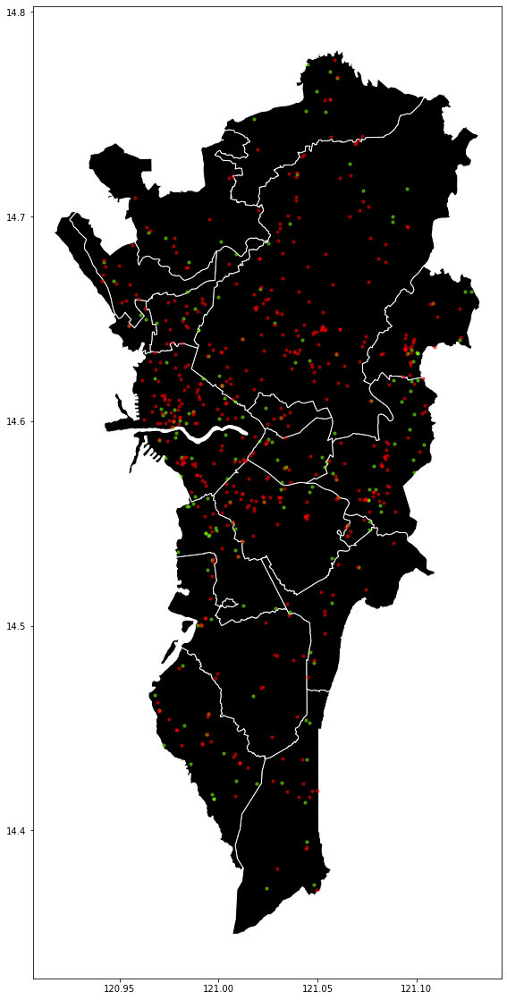

In [11]:
## Exploratory Data Analysis

df_popo.plot(ax=ax, color='chartreuse', markersize=10, alpha=0.5)
df_med.plot(ax=ax, color='red', markersize=10, alpha=0.5);

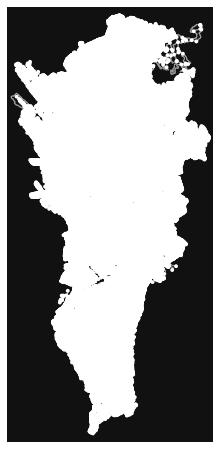

In [15]:
ncr_x = ox.graph_from_place('Metro Manila, Philippines', which_result=1)
ox.plot_graph(ncr_x);

In [137]:
nodes, edges = ox.graph_to_gdfs(ncr_x)

However, knowing those two cities having little enforcement around, that does not only mean that drivers should go around only in those areas. The group further analyzed the map, extracting the edges of the generated geodataframe and filtering out specific road types afterwards.

In [12]:
edges.to_csv('edges.csv')

cols = ['osmid', 'lanes', 'name', 'highway', 'maxspeed', 'oneway', 'length',
        'geometry', 'u', 'v']
edges = pd.read_csv('edges.csv', usecols=cols)

In [13]:
edges

,osmid,lanes,name,highway,maxspeed,oneway,length,geometry,u,v
0,760239290,2,Captain M. Reyes Street,residential,30,False,4.794,"LINESTRING (121.0109966 14.5399639, 121.010992...",31457284,7089553950
1,739796911,2,General V. Belarmino Street,tertiary,30,True,89.673,"LINESTRING (121.0109966 14.5399639, 121.011208...",31457284,31457286
2,760239289,2,General V. Belarmino Street,tertiary,30,True,35.111,"LINESTRING (121.0118197 14.5400887, 121.012142...",31457286,31457287
3,22694473,2,General P. Santos Street,residential,30,False,111.451,"LINESTRING (121.0118197 14.5400887, 121.011799...",31457286,7089553929
4,759024013,2,General P. Santos Street,residential,30,False,52.490,"LINESTRING (121.0118197 14.5400887, 121.011888...",31457286,31457136
...,...,...,...,...,...,...,...,...,...,...
351490,"[577167424, 900627087]",NaN,NaN,residential,NaN,False,56.672,"LINESTRING (121.0191402 14.7343697, 121.018921...",5533667707,5528750511
351491,791248659,NaN,Florida,service,NaN,False,36.844,"LINESTRING (121.0583851 14.5943035, 121.058137...",1598554105,8681167483
351492,146588606,NaN,Farmers Footbridge,footway,NaN,False,45.799,"LINESTRING (121.0509816 14.6201473, 121.050588...",1598554111,1598554077
351493,603932379,NaN,NaN,steps,NaN,False,12.234,"LINESTRING (121.0509816 14.6201473, 121.050959...",1598554111,5731592158


In [14]:
edges.osmid = edges.osmid.astype(str)
edges.drop_duplicates(subset='osmid', inplace=True)

The initial processing that the group has done is to replace maxspeed values into 40 where a speed range of between 20 to 40 is present, and later on dropping NaN maxspeed values as well. Afterwards, highways are the ones considered as road types for the following visualizations.

In [15]:
speed_dict = {}
for i in edges.maxspeed.astype(str).unique():
    try:
        if type(ast.literal_eval(i))==list:
            speed_dict[i] = max([int(k) for k in ast.literal_eval(i)])
        elif type(ast.literal_eval(i))==int:
            speed_dict[i] = int(i)
        elif i == '20 30 40':
            speed_dict[i] = 40
    except:
        speed_dict[i] = 0

edges['maxspeed'] = edges.maxspeed.astype(str).replace(speed_dict)

# edges.maxspeed.fillna('0', inplace=True)
edges.maxspeed.replace('0', np.nan, inplace=True)
edges.dropna(subset=['maxspeed'], inplace=True)

edges['maxspeed'] = edges['maxspeed'].astype(int)

In [18]:
highways = ['residential', 'tertiary', 'secondary', 'primary', 'trunk', 'motorway']
edges = edges[edges.highway.apply(lambda x: x in highways)]

In [19]:
lane_dict = {}
for i in edges.lanes.astype(str).unique():
    try:
        if type(ast.literal_eval(i))==list:
            lane_dict[i] = max([int(k) for k in ast.literal_eval(i)])
        elif type(ast.literal_eval(i))==int:
            lane_dict[i] = int(i)
    except:
        lane_dict[i] = 1
        
edges['lanes'] = edges.lanes.astype(str).replace(lane_dict)

<ipython-input-19-2e4996545c75>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  edges['lanes'] = edges.lanes.astype(str).replace(lane_dict)


In [21]:
edges['geometry'] = edges['geometry'].apply(lambda x: (shapely.wkt.loads(x)))

<ipython-input-21-759acb4fa080>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  edges['geometry'] = edges['geometry'].apply(lambda x: (shapely.wkt.loads(x)))


In [22]:
popo_locs = list(df_popo.way)
p_dist = edges[['osmid', 'geometry']]
p_dist['police'] = [popo_locs for i in range(len(p_dist))]
p_dist = p_dist.explode('police')
p_dist.reset_index(drop=True, inplace=True)
p_dist.shape

<ipython-input-22-2fc40dc6ad53>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  p_dist['police'] = [popo_locs for i in range(len(p_dist))]


(9921296, 3)

The group then extracted the corresponding distances of the geometries with their respective distances to police stations and merged into the edges dataframe.

In [23]:
p_dist['dist'] = p_dist.apply(lambda x: np.round(x.geometry.distance(x.police), 4)*100000, axis=1)
p_dist

,osmid,geometry,police,dist
0,760239290,"LINESTRING (121.0109966 14.5399639, 121.010992...",POINT (121.0654601 14.5490782),5520.0
1,760239290,"LINESTRING (121.0109966 14.5399639, 121.010992...",POINT (121.0761517 14.5469852),6550.0
2,760239290,"LINESTRING (121.0109966 14.5399639, 121.010992...",POINT (121.0762318 14.5510157),6620.0
3,760239290,"LINESTRING (121.0109966 14.5399639, 121.010992...",POINT (121.0084268 14.6096268),6970.0
4,760239290,"LINESTRING (121.0109966 14.5399639, 121.010992...",POINT (121.0018995 14.6174011),7800.0
...,...,...,...,...
9921291,554992834,"LINESTRING (121.0946264 14.6462489, 121.094575...",POINT (121.070686 14.52864),11970.0
9921292,554992834,"LINESTRING (121.0946264 14.6462489, 121.094575...",POINT (120.985061 14.67752),11390.0
9921293,554992834,"LINESTRING (121.0946264 14.6462489, 121.094575...",POINT (120.9644655 14.6921868),13800.0
9921294,554992834,"LINESTRING (121.0946264 14.6462489, 121.094575...",POINT (120.9733278 14.6894763),12880.0


In [26]:
edges = edges.merge(p_dist.sort_values(by='dist').drop_duplicates(subset='osmid'),
                    how='left', on='osmid')

In [27]:
del edges['geometry_x']
edges.rename(columns={'geometry_y': 'geometry'}, inplace=True)

In [28]:
edges

,osmid,lanes,name,highway,maxspeed,oneway,length,u,v,geometry,police,dist
0,760239290,2,Captain M. Reyes Street,residential,30,False,4.794,31457284,7089553950,"LINESTRING (121.0109966 14.5399639, 121.010992...",POINT (121.0120003 14.5414169),180.0
1,739796911,2,General V. Belarmino Street,tertiary,30,True,89.673,31457284,31457286,"LINESTRING (121.0109966 14.5399639, 121.011208...",POINT (121.0120003 14.5414169),130.0
2,760239289,2,General V. Belarmino Street,tertiary,30,True,35.111,31457286,31457287,"LINESTRING (121.0118197 14.5400887, 121.012142...",POINT (121.0120003 14.5414169),130.0
3,22694473,2,General P. Santos Street,residential,30,False,111.451,31457286,7089553929,"LINESTRING (121.0118197 14.5400887, 121.011799...",POINT (121.0120003 14.5414169),130.0
4,759024013,2,General P. Santos Street,residential,30,False,52.490,31457286,31457136,"LINESTRING (121.0118197 14.5400887, 121.011888...",POINT (121.0120003 14.5414169),90.0
...,...,...,...,...,...,...,...,...,...,...,...,...
56366,760239295,2,A. Bonifacio Street,residential,30,True,18.909,31457137,31457136,"LINESTRING (121.0120624 14.5405857, 121.011889...",POINT (121.0120003 14.5414169),80.0
56367,936503217,2,Aurora Boulevard,primary,60,True,4.489,8594653049,32285111,"LINESTRING (121.0516579 14.6223135, 121.051620...",POINT (121.0458157 14.6297577),950.0
56368,130965973,1,Justice Tuazon,residential,30,True,56.134,1441791872,306080228,"LINESTRING (121.0788125 14.6274348, 121.079076...",POINT (121.0884764 14.6198835),1180.0
56369,445459681,1,NaN,residential,0,False,70.611,309854092,309854091,"LINESTRING (121.0531782 14.7458805, 121.052521...",POINT (121.0538586 14.7510332),520.0


Aside from the police stations, the medical facilites were also processed to extract their corresponding distances to their respective geometries.

In [29]:
med_locs = list(df_med.way)
m_dist = edges[['osmid', 'geometry']]
m_dist['med'] = [med_locs for i in range(len(m_dist))]
m_dist = m_dist.explode('med')
m_dist.reset_index(drop=True, inplace=True)
m_dist.shape

<ipython-input-29-41944a7068cc>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  m_dist['med'] = [med_locs for i in range(len(m_dist))]


(26156144, 3)

In [30]:
m_dist

,osmid,geometry,med
0,760239290,"LINESTRING (121.0109966 14.5399639, 121.010992...",POINT (121.0648686 14.5441534)
1,760239290,"LINESTRING (121.0109966 14.5399639, 121.010992...",POINT (121.0652174 14.5440845)
2,760239290,"LINESTRING (121.0109966 14.5399639, 121.010992...",POINT (121.0668653 14.546127)
3,760239290,"LINESTRING (121.0109966 14.5399639, 121.010992...",POINT (121.0652545 14.5490415)
4,760239290,"LINESTRING (121.0109966 14.5399639, 121.010992...",POINT (121.0735289 14.5516358)
...,...,...,...
26156139,554992834,"LINESTRING (121.0946264 14.6462489, 121.094575...",POINT (120.9576968 14.7092014)
26156140,554992834,"LINESTRING (121.0946264 14.6462489, 121.094575...",POINT (120.9951921 14.6985432)
26156141,554992834,"LINESTRING (121.0946264 14.6462489, 121.094575...",POINT (121.0200239 14.703293)
26156142,554992834,"LINESTRING (121.0946264 14.6462489, 121.094575...",POINT (121.005167 14.7187774)


In [31]:
m_dist['dist2'] = m_dist.apply(lambda x: np.round(x.geometry.distance(x.med), 4)*100000, axis=1)
m_dist

,osmid,geometry,med,dist2
0,760239290,"LINESTRING (121.0109966 14.5399639, 121.010992...",POINT (121.0648686 14.5441534),5400.0
1,760239290,"LINESTRING (121.0109966 14.5399639, 121.010992...",POINT (121.0652174 14.5440845),5440.0
2,760239290,"LINESTRING (121.0109966 14.5399639, 121.010992...",POINT (121.0668653 14.546127),5620.0
3,760239290,"LINESTRING (121.0109966 14.5399639, 121.010992...",POINT (121.0652545 14.5490415),5500.0
4,760239290,"LINESTRING (121.0109966 14.5399639, 121.010992...",POINT (121.0735289 14.5516358),6360.0
...,...,...,...,...
26156139,554992834,"LINESTRING (121.0946264 14.6462489, 121.094575...",POINT (120.9576968 14.7092014),15070.0
26156140,554992834,"LINESTRING (121.0946264 14.6462489, 121.094575...",POINT (120.9951921 14.6985432),11230.0
26156141,554992834,"LINESTRING (121.0946264 14.6462489, 121.094575...",POINT (121.0200239 14.703293),9390.0
26156142,554992834,"LINESTRING (121.0946264 14.6462489, 121.094575...",POINT (121.005167 14.7187774),11520.0


In [32]:
edges = edges.merge(m_dist.sort_values(by='dist2').drop_duplicates(subset='osmid'),
                    how='left', on='osmid')

In [34]:
del edges['geometry_y']
edges.rename(columns={'geometry_x': 'geometry'}, inplace=True)

In [35]:
edges

,osmid,lanes,name,highway,maxspeed,oneway,length,u,v,geometry,police,dist,med,dist2
0,760239290,2,Captain M. Reyes Street,residential,30,False,4.794,31457284,7089553950,"LINESTRING (121.0109966 14.5399639, 121.010992...",POINT (121.0120003 14.5414169),180.0,POINT (121.0119949 14.5414973),180.0
1,739796911,2,General V. Belarmino Street,tertiary,30,True,89.673,31457284,31457286,"LINESTRING (121.0109966 14.5399639, 121.011208...",POINT (121.0120003 14.5414169),130.0,POINT (121.0119949 14.5414973),140.0
2,760239289,2,General V. Belarmino Street,tertiary,30,True,35.111,31457286,31457287,"LINESTRING (121.0118197 14.5400887, 121.012142...",POINT (121.0120003 14.5414169),130.0,POINT (121.0119949 14.5414973),140.0
3,22694473,2,General P. Santos Street,residential,30,False,111.451,31457286,7089553929,"LINESTRING (121.0118197 14.5400887, 121.011799...",POINT (121.0120003 14.5414169),130.0,POINT (121.0119949 14.5414973),140.0
4,759024013,2,General P. Santos Street,residential,30,False,52.490,31457286,31457136,"LINESTRING (121.0118197 14.5400887, 121.011888...",POINT (121.0120003 14.5414169),90.0,POINT (121.0119949 14.5414973),90.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
56366,760239295,2,A. Bonifacio Street,residential,30,True,18.909,31457137,31457136,"LINESTRING (121.0120624 14.5405857, 121.011889...",POINT (121.0120003 14.5414169),80.0,POINT (121.0119949 14.5414973),90.0
56367,936503217,2,Aurora Boulevard,primary,60,True,4.489,8594653049,32285111,"LINESTRING (121.0516579 14.6223135, 121.051620...",POINT (121.0458157 14.6297577),950.0,POINT (121.0483623 14.6240989),370.0
56368,130965973,1,Justice Tuazon,residential,30,True,56.134,1441791872,306080228,"LINESTRING (121.0788125 14.6274348, 121.079076...",POINT (121.0884764 14.6198835),1180.0,POINT (121.0821964 14.6328478),640.0
56369,445459681,1,NaN,residential,0,False,70.611,309854092,309854091,"LINESTRING (121.0531782 14.7458805, 121.052521...",POINT (121.0538586 14.7510332),520.0,POINT (121.056798 14.7391284),770.0


In [36]:
edges.to_csv('edges2.csv', index=False)

# Map Generation

In order to generate the maps, the group used KMeans clustering to determine the characteristics of roads that have similar attributes to one another. This is based on their maxspeed, as well as their distances from police stations, medical facilities, and road type.

In [37]:
df_cluster = (pd.concat([edges[['osmid', 'lanes', 'maxspeed', 'length', 'dist', 'dist2']],
                         pd.get_dummies(edges.highway)], axis=1).set_index('osmid'))
df_cluster

,lanes,maxspeed,length,dist,dist2,motorway,primary,residential,secondary,tertiary,trunk
osmid,,,,,,,,,,,
760239290,2,30,4.794,180.0,180.0,0,0,1,0,0,0
739796911,2,30,89.673,130.0,140.0,0,0,0,0,1,0
760239289,2,30,35.111,130.0,140.0,0,0,0,0,1,0
22694473,2,30,111.451,130.0,140.0,0,0,1,0,0,0
759024013,2,30,52.490,90.0,90.0,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
760239295,2,30,18.909,80.0,90.0,0,0,1,0,0,0
936503217,2,60,4.489,950.0,370.0,0,1,0,0,0,0
130965973,1,30,56.134,1180.0,640.0,0,0,1,0,0,0


Once the final dataframe has been generated, a clustering algorithm was used to identify specific clusters where drivers can see where to go around Metro Manila with ease and comfort.

In [38]:
scaler = MinMaxScaler()

df_cluster2 = df_cluster.copy()

for col in df_cluster2.columns:
    df_cluster2[col] = scaler.fit_transform(df_cluster2[[col]])

In [77]:
kmeans = KMeans(n_clusters=6, random_state=0).fit(df_cluster2)

In [78]:
try:
    del df_cluster['cluster']
except:
    pass

y_clusters = kmeans.predict(df_cluster2)
df_cluster['cluster'] = y_clusters

In [75]:
def cluster_range(X, clusterer, k_start, k_stop, actual=None):
    ys = []
    inertias = []
    chs = []
    for k in range(k_start, k_stop+1):
        clusterer_k = clone(clusterer)
        clusterer_k.set_params(n_clusters=k)
        y = clusterer_k.fit_predict(X)
        ys.append(y)
        inertias.append(clusterer_k.inertia_)
        chs.append(calinski_harabasz_score(X, y))
    res = {'ys' : ys, 'inertias' : inertias, 'chs' : chs}
    return res

def plot_internal(inertias, chs):
    """Plot internal validation values"""
    fig, ax = plt.subplots()
    ks = np.arange(2, len(inertias)+2)
    ax.plot(ks, inertias, '-o', label='SSE')
    ax.plot(ks, chs, '-ro', label='CH')
    ax.set_xlabel('$k$')
    ax.set_ylabel('SSE/CH')
    return ax

In [70]:
res = cluster_range(df_cluster2, KMeans(random_state=0), 2, 11)

Through the group's recommender system with the Calinski-Harabasz score as the metric, the optimal number of clusters was found to be at 6 for the dataset.

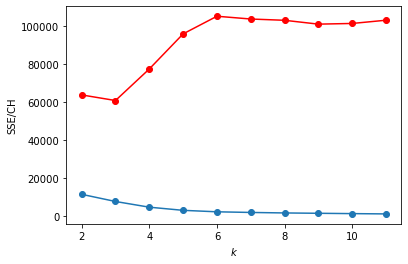

In [76]:
plot_internal(res['inertias'], res['chs']);

In [151]:
df_cluster3 = df_cluster.cluster.reset_index().merge(edges, how='left', on='osmid')

# Analysis of Results


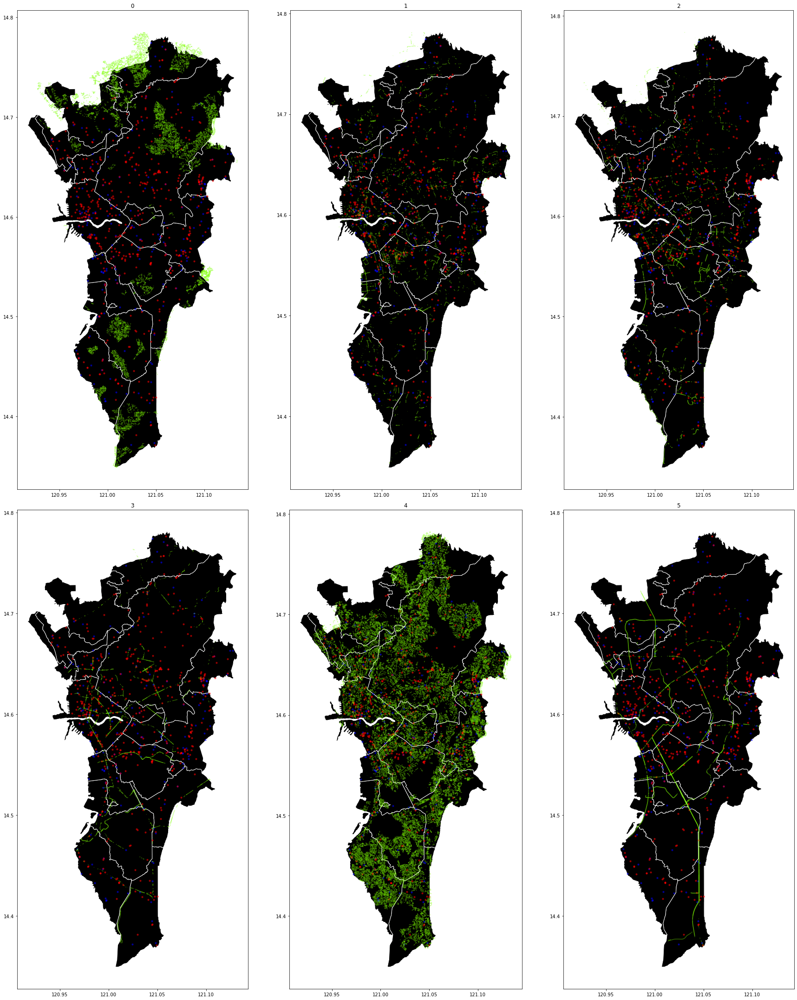

In [154]:
fig, axes = plt.subplots(2, 3, figsize=(25, 30))

for i in range(6):
    if i<3:
        ax = axes[0, i]
    else:
        ax = axes[1, i-3]
    mm_shp.plot(ax=ax,color='black', edgecolor='w')
    graph = gpd.GeoDataFrame(df_cluster3[df_cluster3.cluster==i]['geometry']
                             .reset_index(drop=True))
    graph.plot(ax=ax, color='chartreuse', markersize=10, alpha=0.4)
    df_popo.plot(ax=ax, color='blue', markersize=10, alpha=0.5)
    df_med.plot(ax=ax, color='red', markersize=10, alpha=0.5);
    ax.set_title(i)
plt.tight_layout();

In [247]:
cols = ['cluster', 'name', 'lanes', 'highway', 'maxspeed', 'length', 'dist', 'dist2']
for i in range(6):
    display(df_cluster3[(df_cluster3.cluster==i)][cols].sample(5))

,cluster,name,lanes,highway,maxspeed,length,dist,dist2
21995,0,Galatia,1,residential,0,14.140,1070.0,1300.0
45387,0,Onyx,1,residential,0,151.716,2090.0,1770.0
15539,0,NaN,1,residential,0,194.638,1020.0,1270.0
34958,0,Glasgow,1,residential,0,22.698,1550.0,1380.0
34243,0,Tourmaline,1,residential,0,20.296,1110.0,1110.0


,cluster,name,lanes,highway,maxspeed,length,dist,dist2
9806,1,San Rafael,2,tertiary,0,76.391,710.0,610.0
19074,1,Bocobo Street,1,tertiary,30,121.428,130.0,30.0
52817,1,Diamond,1,tertiary,0,61.799,1020.0,1020.0
7407,1,Hidalgo Street,2,tertiary,30,8.794,110.0,390.0
20230,1,sultan Kudarat,1,tertiary,0,52.911,1010.0,140.0


,cluster,name,lanes,highway,maxspeed,length,dist,dist2
44993,2,Paseo de Roxas,4,secondary,40,57.394,340.0,340.0
21171,2,M. dela Fuente Street,2,secondary,40,28.364,400.0,100.0
52551,2,J. P. Rizal Extension,4,secondary,60,19.213,40.0,640.0
28180,2,Amang Rodriguez Avenue,1,secondary,0,45.322,630.0,820.0
6910,2,Santa Quiteria Road,2,secondary,0,56.091,950.0,400.0


,cluster,name,lanes,highway,maxspeed,length,dist,dist2
18075,3,Andres Bonifacio Avenue,3,primary,60,134.003,400.0,270.0
42816,3,Dr. Arcadio Santos Avenue,3,primary,50,51.185,850.0,350.0
9327,3,Ninoy Aquino Avenue,3,primary,40,147.731,990.0,720.0
28034,3,Plaza Cervantes,2,primary,30,77.350,60.0,30.0
27078,3,Quirino Highway,4,primary,60,50.784,80.0,80.0


,cluster,name,lanes,highway,maxspeed,length,dist,dist2
24415,4,Asteroid,2,residential,0,302.908,170.0,490.0
10016,4,NaN,1,residential,0,96.842,1090.0,770.0
7881,4,R. Layug,1,residential,0,66.709,310.0,140.0
52325,4,Bisugo,1,residential,0,79.160,400.0,500.0
22987,4,Dona Aurora,1,residential,0,424.113,50.0,150.0


,cluster,name,lanes,highway,maxspeed,length,dist,dist2
51821,5,EDSA,3,trunk,60,163.112,250.0,220.0
33361,5,NAIA Expressway,6,motorway,60,852.009,670.0,670.0
51575,5,Globe Rotunda,3,trunk,40,33.901,450.0,1330.0
20419,5,EDSA,4,trunk,60,7.573,830.0,260.0
27833,5,National Road,2,trunk,60,49.632,460.0,100.0


Given the types of clusters generated, the following interpretation per cluster can be seen on the table below:

|Cluster|Interpretation|
|-|-|
|0|Roads in residential areas, thin, far from both med and police|
|1|Thin, equidistant to police and med|
|2|Main roads, short, wide and fast, equidistant to police and med|
|3|Main roads, longer, wide and fast, equidistant to police and med|
|4|Roads in residential areas, thin, close to both med and police|
|5|Highways, long, wide, fast, closer to med than police|

After generating the insights on the clusters, the visualization is plotted out in Folium, where users can see the police stations and medical establishments accordingly. The coordinates of the Asian Institute of Management is used as the starting point.

To demonstrate the visualization, clusters 2, 3, and 5 are the ones chosen to be displayed.

In [226]:
AIM = geocode("Asian Institute of Management", provider="nominatim")
AIM

,geometry,address
0,POINT (121.01880 14.55236),"Asian Institute of Management, 123, Paseo de R..."


In [237]:
df_cluster3.to_csv('df_cluster3.csv', index=False)

Here are all the identified police stations in red for clusters 2, 3, and 5, while the medical establishments are colored in blue.

In [250]:
m = folium.Map([14.592342, 121.036082], zoom_start=11)
# m = folium.Map(location=[AIM.geometry[0].y, AIM.geometry[0].x],
#                  tiles='openstreetmap', zoom_start=15)

chosen = [2, 3, 5]
graph = gpd.GeoDataFrame(df_cluster3[(df_cluster3.cluster.apply(lambda x: x in chosen))]['geometry'],
                         geometry='geometry')
graph = graph.set_crs("EPSG:4326") 
folium.Choropleth(
    graph.geometry,
    line_weight=3,
    line_color='green'
).add_to(m)

for idx, row in df_popo.iterrows():
    Marker([row.way.y, row.way.x],
           tooltip=[row['name']],
           icon=folium.Icon(color='blue', icon='exclamation-sign')).add_to(m)
# mc = MarkerCluster()
# for idx, row in df_popo.iterrows():
#     mc.add_child(Marker([row.way.y, row.way.x], tooltip=row['name'],
#                         icon=folium.Icon(color='red', icon='exclamation-sign')))
# m.add_child(mc)

    
for idx, row in df_med.iterrows():
    Marker([row.way.y, row.way.x],
           tooltip=[row['name']],
           icon=folium.Icon(color='red', icon='plus-sign')).add_to(m)
# mc2 = MarkerCluster()
# for idx, row in df_med.iterrows():
#     mc2.add_child(Marker([row.way.y, row.way.x], tooltip=row['name'],
#                          icon=folium.Icon(color='blue', icon='plus-sign')))
# m.add_child(mc2)
    
m

On the other hand, the visualization below show the clustering of markers for police stations and medical establishments, showing areas where both types of facilities are present

In [252]:
m2 = folium.Map([14.592342, 121.036082], zoom_start=11)

chosen = [2, 3, 5]
graph = gpd.GeoDataFrame(df_cluster3[(df_cluster3.cluster.apply(lambda x: x in chosen))]['geometry'],
                         geometry='geometry')
graph = graph.set_crs("EPSG:4326") 
folium.Choropleth(
    graph.geometry,
    line_weight=3,
    line_color='green'
).add_to(m2)

mc = MarkerCluster()
for idx, row in df_popo.iterrows():
    mc.add_child(Marker([row.way.y, row.way.x], tooltip=row['name'],
                        icon=folium.Icon(color='red', icon='exclamation-sign')))
m2.add_child(mc)

mc2 = MarkerCluster()
for idx, row in df_med.iterrows():
    mc2.add_child(Marker([row.way.y, row.way.x], tooltip=row['name'],
                         icon=folium.Icon(color='blue', icon='plus-sign')))
m2.add_child(mc2)
    
m2

# Conclusion

The group was able to identify clusters for drivers to pick on what type of roads to take during curfew hours to ensure a comfortable drive around Metro Manila, each with their own corresponding distances to either police stations or medical establishments. Should accidents come their way, they can either easily file for a police report or get immediate medical attention wherever possible.

# Recommendation

Given that the assumption of the group is for the drivers to travel during curfew hours, future researchers can integrate additional traffic data so that this approach can be applied on normal working hours and even a possible deeper study focusing on which streets to go to or avoid during rush hour, considering their distances to other establishments of interest.

## References

Lopez, E. (2019, March 8). Manila's commutes from hell - a photo essay. the Guardian. https://www.theguardian.com/world/2019/mar/08/manilas-commutes-from-hell-a-photo-essay

Metro Manila’s traffic problem explained. (2020, October 14). Rappler. https://www.rappler.com/newsbreak/explainers/explanation-metro-manila-traffic-public-commute-problem

New curfew hours for Metro Manila to start May 1. (2021, April 28). CNN Philippines. https://cnnphilippines.com/news/2021/4/28/mmda-metro-manila-curfew-may1.html